In [62]:
import pandas as pd
import numpy as np
import os
import seaborn as sns
pd.set_option('max_columns', 100)

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.path import Path
def create_football_field(linenumbers=True,
                          endzones=True,
                          highlight_line=False,
                          highlight_line_x=50,
                          highlighted_name='Line of Scrimmage',
                          fifty_is_los=False,
                          figscale=0.1):
    """
    Function that plots the football field for viewing plays.
    Allows for showing or hiding endzones.
    """
    rect = patches.Rectangle((0, 0), 120, 53.3, linewidth=0.1,
                             edgecolor='r', facecolor='darkgreen', zorder=0)

    figsize = (120*figscale, 53.3*figscale)
    fig, ax = plt.subplots(1, figsize=figsize)
    ax.add_patch(rect)

    plt.plot([10, 10, 10, 20, 20, 30, 30, 40, 40, 50, 50, 60, 60, 70, 70, 80,
              80, 90, 90, 100, 100, 110, 110, 120, 0, 0, 120, 120],
             [0, 0, 53.3, 53.3, 0, 0, 53.3, 53.3, 0, 0, 53.3, 53.3, 0, 0, 53.3,
              53.3, 0, 0, 53.3, 53.3, 0, 0, 53.3, 53.3, 53.3, 0, 0, 53.3],
             color='white')
    if fifty_is_los:
        plt.plot([60, 60], [0, 53.3], color='gold')
        plt.text(62, 50, '<- Player Yardline at Snap', color='gold')
    # Endzones
    if endzones:
        ez1 = patches.Rectangle((0, 0), 10, 53.3,
                                linewidth=0.1,
                                edgecolor='r',
                                facecolor='blue',
                                alpha=0.2,
                                zorder=0)
        ez2 = patches.Rectangle((110, 0), 120, 53.3,
                                linewidth=0.1,
                                edgecolor='r',
                                facecolor='blue',
                                alpha=0.2,
                                zorder=0)
        ax.add_patch(ez1)
        ax.add_patch(ez2)
    plt.xlim(0, 120)
    plt.ylim(-5, 58.3)
    plt.axis('off')
    if linenumbers:
        for x in range(20, 110, 10):
            numb = x
            if x > 50:
                numb = 120 - x
            plt.text(x, 5, str(numb - 10),
                     horizontalalignment='center',
                     fontsize=20,  # fontname='Arial',
                     color='white')
            plt.text(x - 0.95, 53.3 - 5, str(numb - 10),
                     horizontalalignment='center',
                     fontsize=20,  # fontname='Arial',
                     color='white', rotation=180)
    if endzones:
        hash_range = range(11, 110)
    else:
        hash_range = range(1, 120)

    for x in hash_range:
        ax.plot([x, x], [0.4, 0.7], color='white')
        ax.plot([x, x], [53.0, 52.5], color='white')
        ax.plot([x, x], [22.91, 23.57], color='white')
        ax.plot([x, x], [29.73, 30.39], color='white')

    if highlight_line:
        hl = highlight_line_x
        plt.plot([hl, hl], [0, 53.3], color='yellow')
        # plt.text(hl + 2, 50, '<- {}'.format(highlighted_name),
        #          color='yellow')
    return fig, ax

In [71]:
train2021 = pd.read_csv('./dataNorm/week16_norm.csv')
seavskc = train2021.query('displayName == "Russell Wilson"').groupby(['playId'], as_index=False).first()
seavskc.head()

,playId,time,x,y,s,a,dis,o,dir,event,nflId,displayName,jerseyNumber,position,frameId,team,gameId,playDirection,route,los,los_norm,x_norm,y_norm
0,255,2018-12-24T01:28:51.200Z,76.83,23.50,0.00,0.00,0.00,260.13,139.51,None,2532975.0,Russell Wilson,3.0,QB,1,home,2018122314,left,NaN,73.32,40,36.49,29.80
1,277,2018-12-24T01:29:29.500Z,77.21,23.42,0.03,0.03,0.02,260.70,219.67,None,2532975.0,Russell Wilson,3.0,QB,1,home,2018122314,left,NaN,74.00,40,36.79,29.88
2,775,2018-12-24T01:49:24.299Z,83.02,23.53,0.01,0.01,0.01,263.75,299.73,None,2532975.0,Russell Wilson,3.0,QB,1,home,2018122314,left,NaN,79.80,40,36.78,29.77
3,800,2018-12-24T01:49:56.000Z,70.53,29.67,0.10,0.07,0.01,252.84,337.50,None,2532975.0,Russell Wilson,3.0,QB,1,home,2018122314,left,NaN,69.29,40,38.76,23.63
4,833,2018-12-24T01:50:48.000Z,44.51,23.62,0.01,0.01,0.00,237.91,10.76,None,2532975.0,Russell Wilson,3.0,QB,1,home,2018122314,left,NaN,44.10,40,39.59,29.68


In [72]:
plays = list(seavskc[['gameId', 'playId']].to_records(index=False))

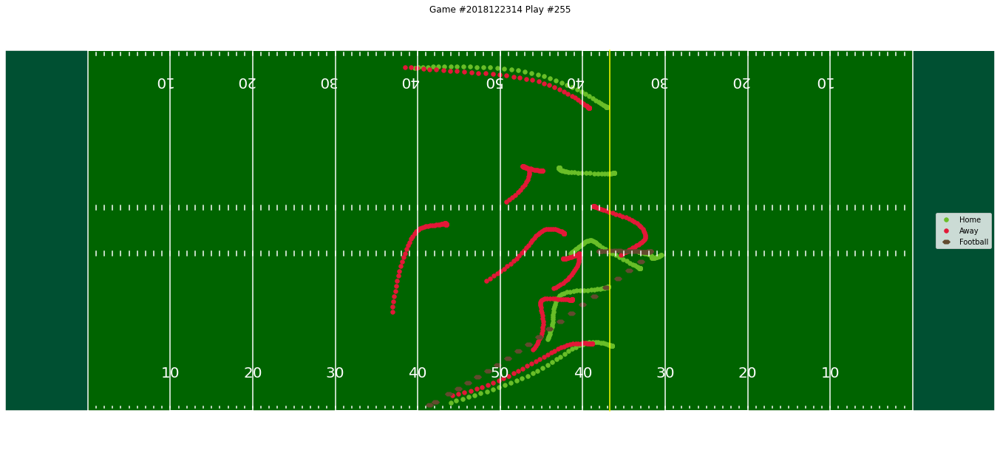

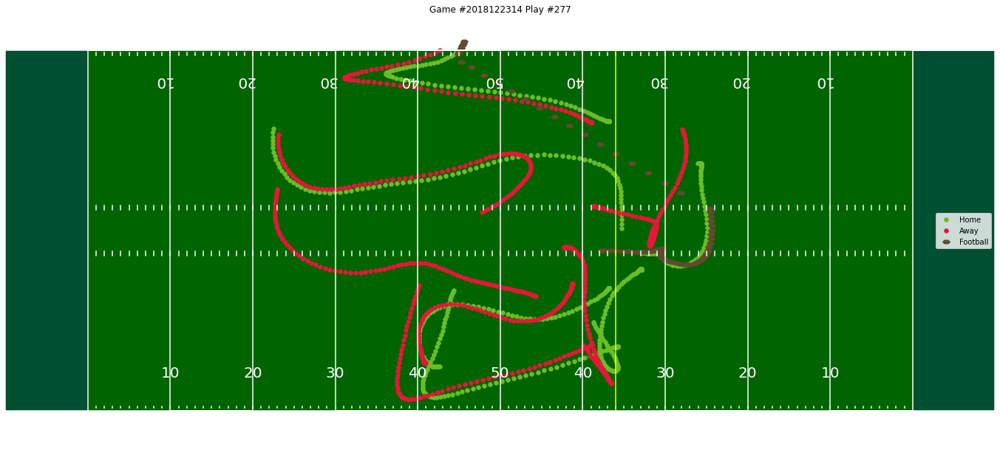

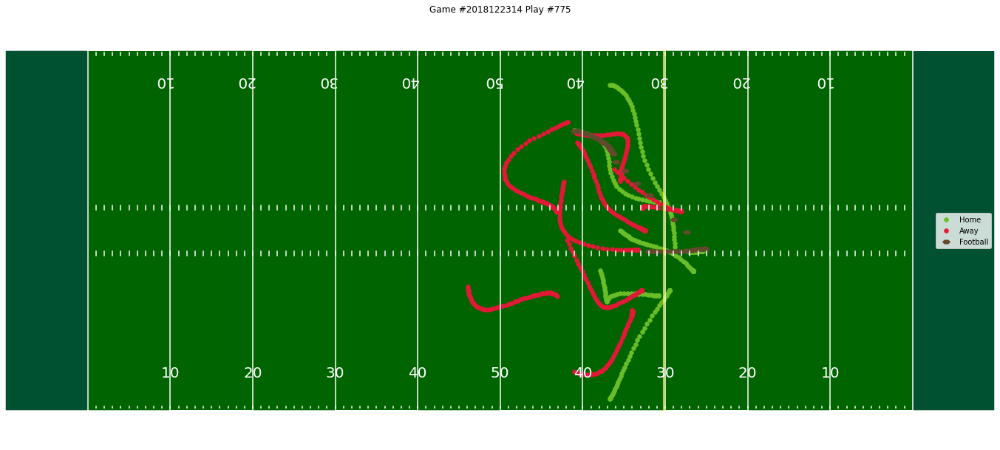

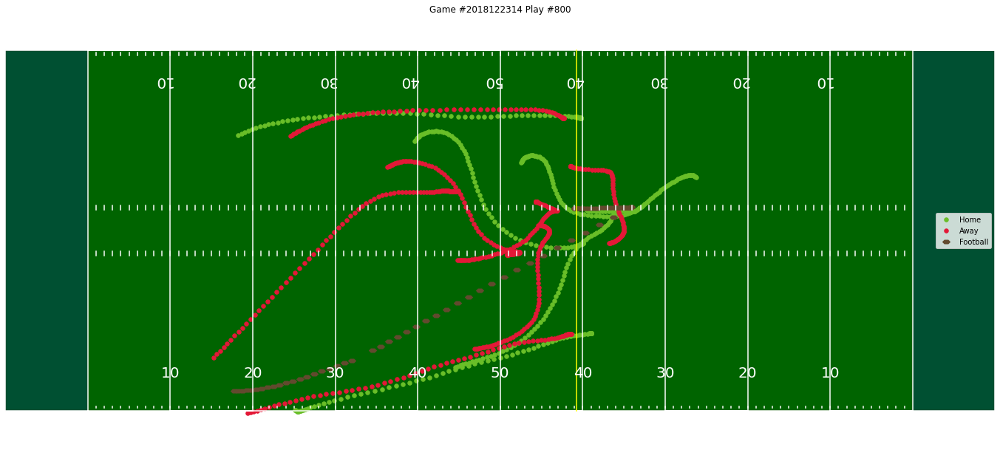

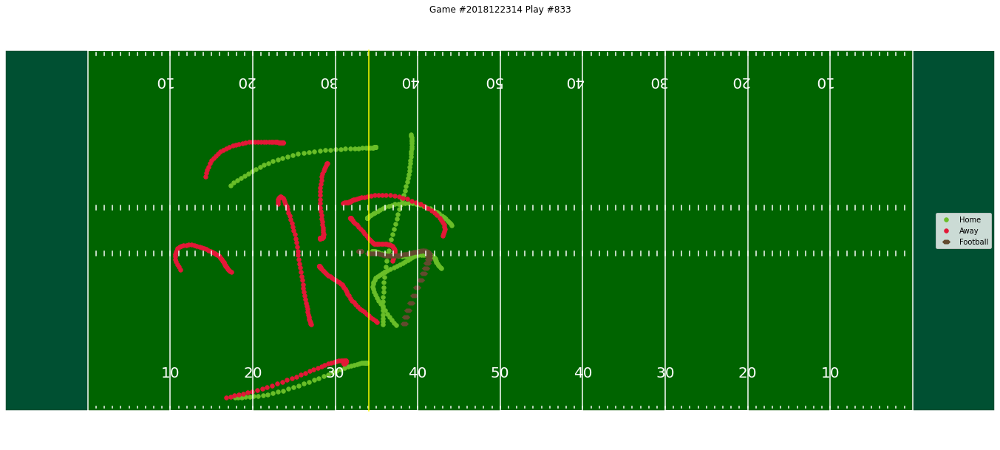

...

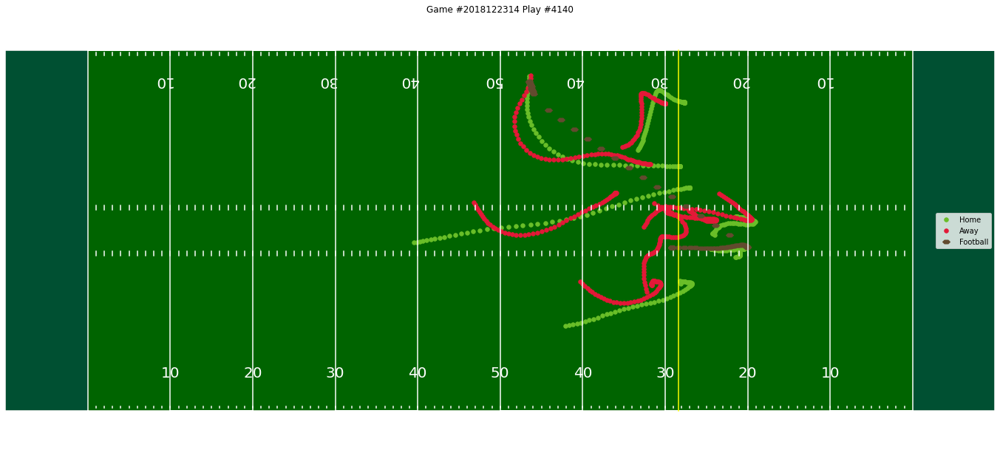

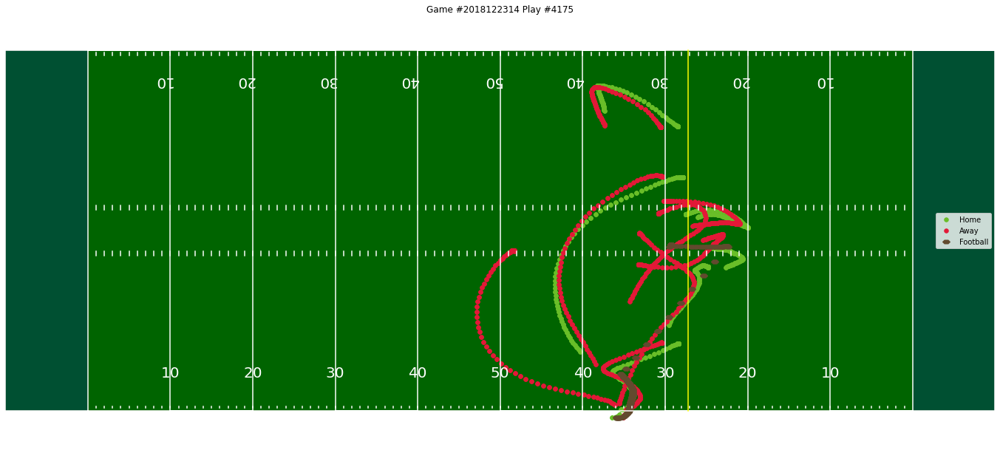

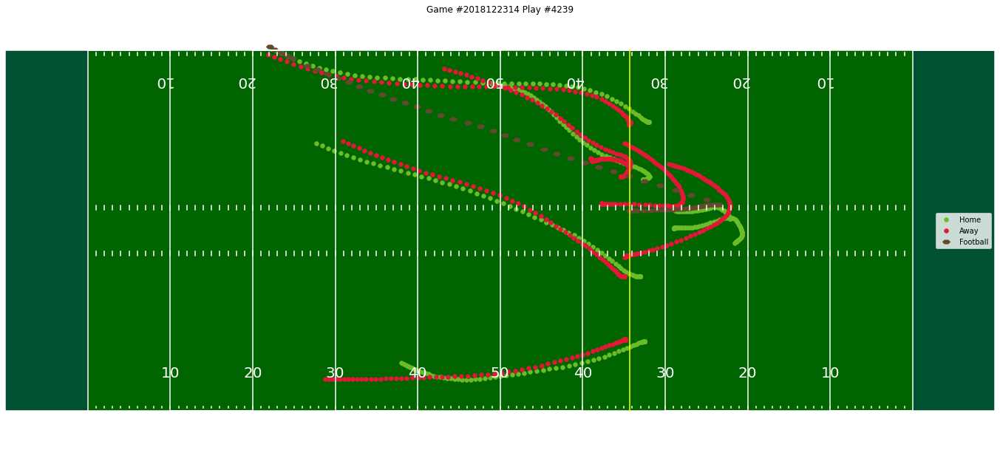

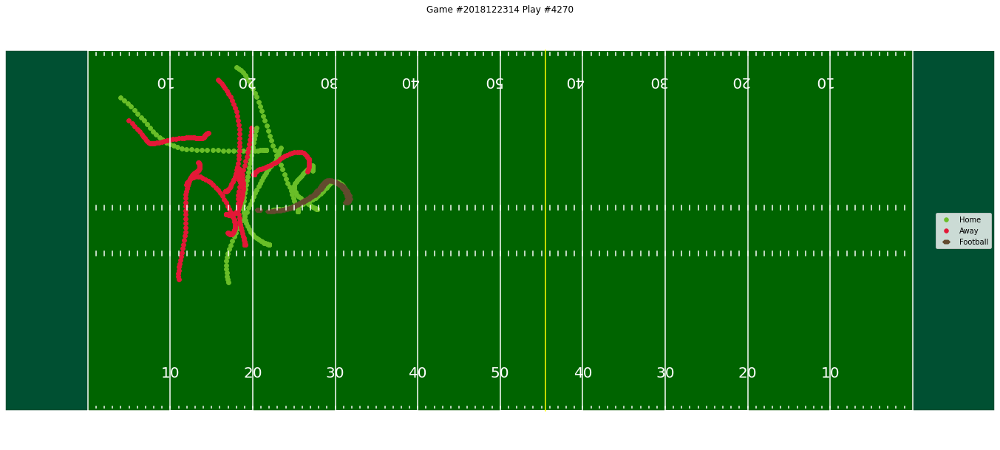

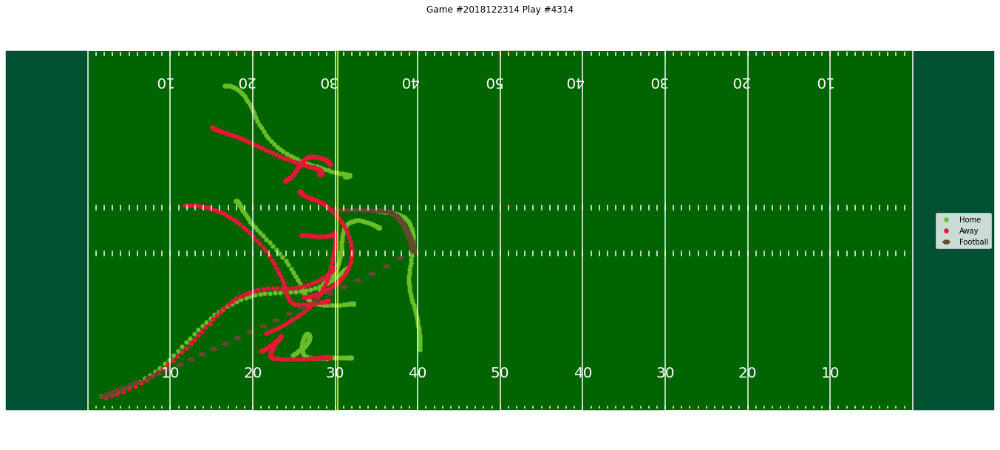

In [73]:

verts = [
   (-0.4, 0.),  # left, bottom
   (-0.2, 0.2),  # left, top
   (0.2, 0.2),  # right, top
   (0.4, -0.),  # right, bottom
   (0.2, -0.2),  # left, bottom
   (-0.2, -0.2),  # left, top
   (-0.4, 0),  # left, bottom
]

codes = [
    Path.MOVETO,
    Path.LINETO,
    Path.LINETO,
    Path.LINETO,
    Path.LINETO,
    Path.LINETO,
    Path.CLOSEPOLY,
]

ball = Path(verts, codes, closed=True)

for ex_game_id, ex_play_id in plays[:]:
    example_play_home = train2021.query('gameId == @ex_game_id and playId == @ex_play_id and team == "home"')
    example_play_away = train2021.query('gameId == @ex_game_id and playId == @ex_play_id and team == "away"')
    example_play_football = train2021.query('gameId == @ex_game_id and playId == @ex_play_id and team == "football"')

    yl = train2021.query("playId == @ex_play_id")['los'].tolist()[0]
    fig, ax = create_football_field(highlight_line=True,
                                    highlight_line_x=yl,
                                    figscale=0.2)
    example_play_home.plot(x='x', y='y', kind='scatter', ax=ax, color='#69BE28', s=30, label='Home')
    example_play_away.plot(x='x', y='y', kind='scatter', ax=ax, color='#E31837', s=30, label='Away')
    example_play_football.plot(x='x', y='y', kind='scatter', ax=ax, color='#624a2e', s=100, label='Football', marker=ball)
    plt.title(f'Game #{ex_game_id} Play #{ex_play_id}')
    plt.legend()
    plt.show()


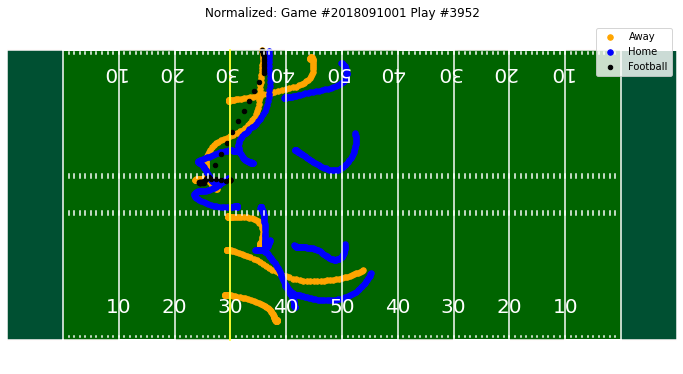

In [13]:
yl = train2021.query("playId == @ex_play_id")['los_norm'].tolist()[0]
fig, ax = create_football_field(highlight_line=True,
                                highlight_line_x=yl)
example_play_home.plot(x='x_norm', y='y_norm', kind='scatter', ax=ax, color='orange', s=30, label='Away')
example_play_away.plot(x='x_norm', y='y_norm', kind='scatter', ax=ax, color='blue', s=30, label='Home')
example_play_football.plot(x='x_norm', y='y_norm', kind='scatter', ax=ax, color='black', s=20, label='Football')
plt.title(f'Normalized: Game #{ex_game_id} Play #{ex_play_id}')
plt.legend()
plt.show()